 # Modelos para VPO de Kepler-451

O objetivo deste algoritmo *MCMC* adaptado para o *Stretch Move* é a busca por fenômenos associados à variação do período orbital do sistema binário Kepler-451 por meio do ajuste da efeméride linear dos tempos dos mínimos de luz calculados, $T_C$, e da contribuição do efeito tempo-luz proporcionado por corpos extras ligados gravitacionalmente ao sistema, $\tau$. Sugerimos dois modelos multiplanetários onde a ligação gravitacional entre os corpos extras e a binária podem estar provocando sua variação orbital aparente:

**(i)** sistema com dois planetas circumbinários;

**(ii)** sistema com três planetas circumbinários.

O resíduo do ajuste destas efemérides lineares nos fornecem os diagramas ($O-C$).

Vamos começar importando as bibliotecas necessárias para esse ajuste e binando os dados para as barras de erro:

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import smplotlib
from astropy import table
from astropy.io import ascii
from numba import jit
from scipy import optimize
from IPython.display import display, Math
import emcee
import corner

In [36]:
def adaptative_bin(x, y, yerr, oc, nbins):
    
    bins = np.array_split(x, nbins)

    xbin    = np.array([np.median(bin) for bin in bins])
    ybin    = np.array([np.median(y[np.in1d(x, bin)]) for bin in bins])
    yerrbin = np.array([np.std(yerr[np.in1d(x, bin)]) for bin in bins])
    ocbin   = np.array([np.median(oc[np.in1d(x, bin)]) for bin in bins])

    return xbin, ybin, yerrbin, ocbin

Agora vamos importar os dados fotométricos coletados desse sistema entre os anos de 2008 a 2024. O arquivo `2008_2024.txt` possui os ciclos, instantes dos eclipses em *BJD*-2450000 e os erros dos instantes ajustados pelo modelo WD+PIKAIA.

Esse arquivo contém observações de 2008 confidenciais do Prof. Dr. Leonardo Andrade de Almeida, os dados obtidos pela missão *Kepler* de 2009 a 2013 com uma cadência de 60 s (Q0 e Q5 a Q17) e os dados obtidos pelo *TESS* de 2019 a 2024 dos setores 14 e 15 com cadência de 120 s e os setores 40, 54, 74 e 75 com cadência de 20 s.

Os instantes dos eclipses em *BKJD* e *BTJD*, baixados pela função [`search_lightcurve()`](https://iopscience.iop.org/article/10.3847/1538-3881/aafc33/meta) da biblioteca [`lightkurve`](https://ui.adsabs.harvard.edu/abs/2018ascl.soft12013L/abstract) do `python` e ajustados por nós pelo método WD+PIKAIA, foram convertidos para *BJD*-2450000 através de uma ferramenta `cl` do *IRAF*, obedecendo a sequinte relação:

$\begin{cases}
    BJD = BKJD + 2454833\\
    BJD = BTJD + 2457000
\end{cases}$

In [15]:
data = ascii.read('2008_2024.dat')

x    = data['cycle']
y    = data['time']
yerr = data['time_err']

data[:5]

cycle,time,time_err
float64,float64,float64
-2486.0,4640.8642,4e-05
-1891.0,4715.6944,4e-05
-1772.0,4730.6606,4e-05
-1557.0,4757.7001,4e-05
2.0,4953.768147,9e-06


Para nossos modelos de análise da VPO do sistema, usamos a seguinte equação: 

$$T_{min} = T_0 + EP + \sum_{1}^{N}\tau_j ,$$

onde a primeira parte é referente a efeméride linear dos $T_C$ calculados pelo modelo WD+PIKAIA e o terceiro termo,

$$\tau_j = \frac{a_j\sin i_j}{c}\left[\frac{1-e^2_j}{1+e_j\cos\nu_j}\sin\left(\nu_j + \overline{\omega}_j\right)+e_j\sin\overline{\omega}_j\right] ,$$

é a contribuição do ETL pelo j-ésimo corpo externo. A anomalia verdadeira, $\nu_j$, é derivada pelas seguintes relações:

1.  $\tan\left(\frac{\nu_j}{2}\right) = \sqrt{\frac{1+e_j}{1-e_j}}\tan\left(\frac{\epsilon_j}{2}\right)$

2.  $\epsilon_j - e_j\sin\epsilon_j = \mathcal{M_j}$ (eq. transcendente da anomalia excêntrica)

3.  $\epsilon_j \sim \mathcal{M_j} + \left(e_j - \frac{3}{24}e^2_j\right)\sin(\mathcal{M_j}) + \left(\frac{e^2_j}{2}-\frac{e^4_j}{8}\right)\sin(2\mathcal{M_j}) \ldots$ (solução da eq. transcendente)

4.  $\mathcal{M_j} = \frac{2\pi}{P_j}(T_0 + EP - T_j)$ (anomalia média)

Usamos o período orbital para a binária, $P$, encontrado por [Baran et al.](https://www.aanda.org/articles/aa/abs/2015/05/aa25392-14/aa25392-14.html) como entrada para o `optimize`.

# (i) Modelo com dois planetas

Ideia inicial: considerar um sistema com 2 planetas circumbinários, sendo eles:

- Um planeta com órbita de $\sim$400 dias;

- Um planeta com órbita de $\sim$4000 dias.

Como solução preliminar de entrada para o *Stretch Move*, executamos a função `optimize.curve_fit()`, da biblioteca [`scipy`](https://ui.adsabs.harvard.edu/abs/2022zndo...6940349G/abstract),
para fornecer os parâmetros iniciais para a solução final.

In [10]:
@jit(nopython=True)
def model_2bodys (x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4):
    
    c   = 299792458               # velocidade da luz no váucuo [m/s]            
    UA  = 149597870700            # unidade astronômica [m]
    
    n_points = len(x)

    efli = np.zeros(n_points)     
    tau3 = np.zeros(n_points)
    tau4 = np.zeros(n_points)

    r3   = 360./P3                # movimento angular médio do terceiro corpo externo
    r4   = 360./P4                # movimento angular médio do quarto corpo externo

    for idx in range(n_points):
        n = x[idx]
        
        # Efeméride linear
        el = T0 + P*n
        efli[idx] = el
        
        # Primeiro corpo externo
        M  = ((T0 + P*n) - T3)*r3    # anomalia média do terceiro corpo
        M1 = M -(360*int(M/360.))    # M[0°,360°]
        M2 = M1 * np.pi / 180.
        eps = M2 + e3*np.sin(M2)     # solução da eq. transcendente da anomalia excêntrica com excentricidade até 1° ordem
        eps1 = eps + (M2 - (eps - e3*np.sin(eps)))/(1.0 - e3*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e3*np.sin(eps1)))/(1.0 - e3*np.cos(eps1))
        q  = np.sqrt((1.0 + e3) / (1.0 - e3)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       # anomalia verdadeira
        aux1  = asini3*UA / (c*24*3600)
        aux2  = ((1. - e3**2) / (1 + e3*np.cos(v))) * np.sin(v + ((o3%360)*np.pi/180.))
        aux3  = e3*np.sin((o3%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau3[idx] = mody
        
        # Segundo corpo externo
        M  = ((T0 + P*n) - T4)*r4    # anomalia média do quarto corpo
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e4*np.sin(M2)     
        eps1 = eps + (M2 - (eps - e4*np.sin(eps)))/(1.0 - e4*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e4*np.sin(eps1)))/(1.0 - e4*np.cos(eps1))
        q  = np.sqrt((1.0 + e4) / (1.0 - e4)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini4*UA / (c*24*3600)
        aux2  = ((1. - e4**2) / (1 + e4*np.cos(v))) * np.sin(v + ((o4%360)*np.pi/180.))
        aux3  = e4*np.sin((o4%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau4[idx] = mody

    Tmin = efli + tau3 + tau4 
    return Tmin


p0 = [0.125765282, 4953.516,
      404, 1243, 0.16, 1.34278*np.sin(179.904*np.pi/180), 140,
      4200, 1243, 0.40, 7.98635*np.sin(350.822*np.pi/180), 270]

bounds = [(0.1250, 4900,
           300, 1000, 0.0, 0., 0, 0,
           1000, 1000, 0.0, 0. , 0., 0.),
          (0.1260, 5000,
           np.inf, 2000, 0.99, 10., 360, 360,
           np.inf, 2000, 0.99, 10., 360, 360)]

params2_, cov2_ = optimize.curve_fit(model_2bodys, x, y, sigma=yerr, p0 = p0, maxfev=5000)
params2_

array([ 1.25765294e-01,  4.95351661e+03,  4.06816812e+02,  1.29485770e+03,
        1.39859489e-01,  2.09045608e-03,  1.44287138e+02,  4.36763922e+03,
        1.17037140e+03,  4.26403808e-01, -1.39314272e-02,  3.64483281e+02])

Usamos o Teorema de Bayes,


$$\mathbb{P}(\boldsymbol{\theta}|\mathbf{D}) = \frac{\mathbb{P}(\mathbf{D}|\boldsymbol{\theta})\mathbb{P}(\boldsymbol{\theta})}{\mathbb{P}(\mathbf{D})} ,$$

para definir a distribuição a posteriori dos parâmetros $\theta$ do modelo com $D$ dados, $\mathbb{P}(\boldsymbol{\theta}|\mathbf{D})$. Sendo assim, a posterior é proporcional à verossimilhança, $\mathbb{P}(\mathbf{D}|\boldsymbol{\theta})$, e à distribuição a priori, $\mathbb{P}(\boldsymbol{\theta})$:

$$\mathbb{P}(\boldsymbol{\theta}|\mathbf{D}) \propto \mathbb{P}(\mathbf{D}|\boldsymbol{\theta})\mathbb{P}(\boldsymbol{\theta}) \\ ln\mathbb{P}(\boldsymbol{\theta}|\mathbf{D}) \propto ln\mathbb{P}(\mathbf{D}|\boldsymbol{\theta}) + ln\mathbb{P}(\boldsymbol{\theta})$$

E a verossimilhança na forma:

$$\mathbb{P}(\mathbf{D}|\boldsymbol{\theta}) = -\frac{1}{2}\sum_{1}^{N}\left(\frac{O_j - C_j}{\sigma_j}\right)^2$$

In [11]:
@jit(nopython=True)
def lnlike_model2(theta, x, y, yerr):
    P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4 = theta
    model = model_2bodys(x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4)
    chi2 = np.sum(((y - model)/yerr)**2)
    if np.isnan(chi2) or np.isinf(chi2):
        return -np.inf
    return -0.5 * chi2    


@jit(nopython=True)
def lnprior_model2(theta):
    P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4 = theta
    if (0.1257 < P < 0.1258 and 4953.51 < T0 < 4953.53 and
        300 < P3 < 500 and 1400 < T3 < 2000 and 0.0 <= e3 < 0.99 and -10 < asini3 < 10 and 90 < o3 < 420 and
        3000 < P4 < 6000 and 1000 < T4 < 2000 and 0.0 <= e4 < 0.99 and -10 < asini4 < 10 and 0 < o4 <= 360):
        return 0.0
    return -np.inf


@jit(nopython=True)
def lnpos_model2(theta, x, y, yerr):
    lnprior = lnprior_model2(theta)
    if not np.isfinite(lnprior):
        return -np.inf
    return lnprior + lnlike_model2(theta, x, y, yerr)     

Definindo os parâmetros iniciais para o *MCMC* como os definidos pelo `optimize`:

In [6]:
params2_

array([ 1.25765294e-01,  4.95351661e+03,  4.06816812e+02,  1.29485770e+03,
        1.39859489e-01,  2.09045608e-03,  1.44287138e+02,  4.36763922e+03,
        1.17037140e+03,  4.26403808e-01, -1.39314272e-02,  3.64483281e+02])

In [12]:
Pi      = 1.25765294e-01
T0i     = 4.95351661e+03
P3i     = 4.06816812e+02
T3i     = 1.29485770e+03 + 200
e3i     = 1.39859489e-01
asini3i = 2.09045608e-03
o3i     = 1.44287138e+02
P4i     = 4.36763922e+03
T4i     = 1.17037140e+03
e4i     = 4.26403808e-01
asini4i = -1.39314272e-02
o4i     = 3.64483281e+02 % 360

initial = np.array([])
initial = Pi, T0i, P3i, T3i, e3i, asini3i, o3i, P4i, T4i, e4i, asini4i, o4i

Definindo nosso *walker*, responsável pela exploração do espaço de parâmetros:

In [13]:
pos1 = np.array([])
pos2 = np.array([])
walk = [1e-5 for i in range(len(initial))]
for i in range(4*len(initial)):
    for j in range(len(walk)):
        pos = initial[j] + walk[j] * np.random.randn(1)
        pos1 = np.append(pos1, pos)

pos2 = np.concatenate((pos2, pos1))
pos3 = np.reshape(pos2, (-1, len(initial)))

labels = ['P', 'T0', 'P3', 'T3', 'e3', 'asini3', 'o3', 'P4', 'T4', 'e4', 'asini4', 'o4']
print('+--------------------------------------+')
print('                 Ranges')
print('+--------------------------------------+')
for i in range(len(labels)):
    print(labels[i]+' = (%.8f, %.8f)'%(min(pos3[:,i]), max(pos3[:,i])))

+--------------------------------------+
                 Ranges
+--------------------------------------+
P = (0.12574568, 0.12579811)
T0 = (4953.51658853, 4953.51663079)
P3 = (406.81679308, 406.81683636)
T3 = (1494.85768056, 1494.85771860)
e3 = (0.13983482, 0.13988482)
asini3 = (0.00207212, 0.00210804)
o3 = (144.28711665, 144.28715863)
P4 = (4367.63917892, 4367.63923222)
T4 = (1170.37137815, 1170.37142761)
e4 = (0.42638366, 0.42642659)
asini4 = (-0.01395130, -0.01390656)
o4 = (4.48326012, 4.48330091)


Implementando a variação *Stretch Move* do *MCMC* por meio da biblioteca [`emcee`](https://iopscience.iop.org/article/10.1086/670067/meta) do `python`:

In [14]:
nwalkers, ndim = pos3.shape

sampler = emcee.EnsembleSampler(nwalkers, ndim, lnpos_model2, args=(x, y, yerr))
sampler.run_mcmc(pos3, 5000, progress=True);
samples = sampler.chain[:, :, :].reshape((-1, ndim))
ndim

100%|██████████| 5000/5000 [34:33<00:00,  2.41it/s]


12

Plotando as distribuições a posterioris dos parâmetros ajustados (*trace-plot*):

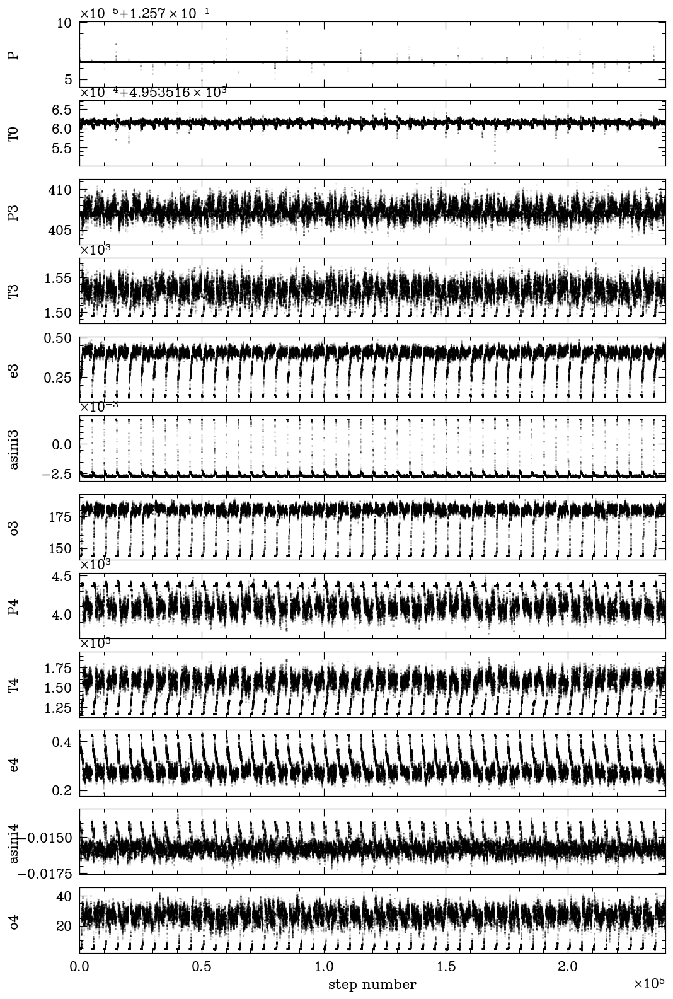

In [15]:
fig, axes = plt.subplots(ndim, figsize=(10, 16), sharex=True)
samples = sampler.chain[:, :, :].reshape((-1, ndim))
labels = ['P', 'T0', 'P3', 'T3', 'e3', 'asini3', 'o3', 'P4', 'T4', 'e4', 'asini4', 'o4']

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, i,], ".k", alpha=0.1, ms=1)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
axes[-1].set_xlabel("Número de passos");
fig.savefig("aposteriori_2bodys.png")

Para sistemas com dois e três planetas, é necessário um *burn-in* de pelo menos algumas centenas:

In [16]:
flat_samples2 = sampler.get_chain(discard=2000, flat=True)

Calculando os percentis (16%, 50% e 84%) de amostras da cadeia *MCMC* para cada parâmetro do modelo:

In [18]:
results2 = np.array([])
erroinf2 = np.array([])
errosup2 = np.array([])
for i in range(ndim):
    mcmc = np.percentile(flat_samples2[:, i], [16, 50, 84])
    q    = np.diff(mcmc)
    results2 = np.append(results2, mcmc[1])
    erroinf2 = np.append(erroinf2, q[0])
    errosup2 = np.append(errosup2, q[1])
    txt = "\mathrm{{{3}}} = {0:.4f}_{{-{1:.4f}}}^{{{2:.4f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

array([ 1.25765295e-01,  4.95351662e+03,  4.07489542e+02,  1.53214651e+03,
        4.10602585e-01, -2.69808119e-03,  1.80261503e+02,  4.08312561e+03,
        1.59861366e+03,  2.71551457e-01, -1.57987038e-02,  2.65685694e+01])

Plotando o Diagrama de Corner:

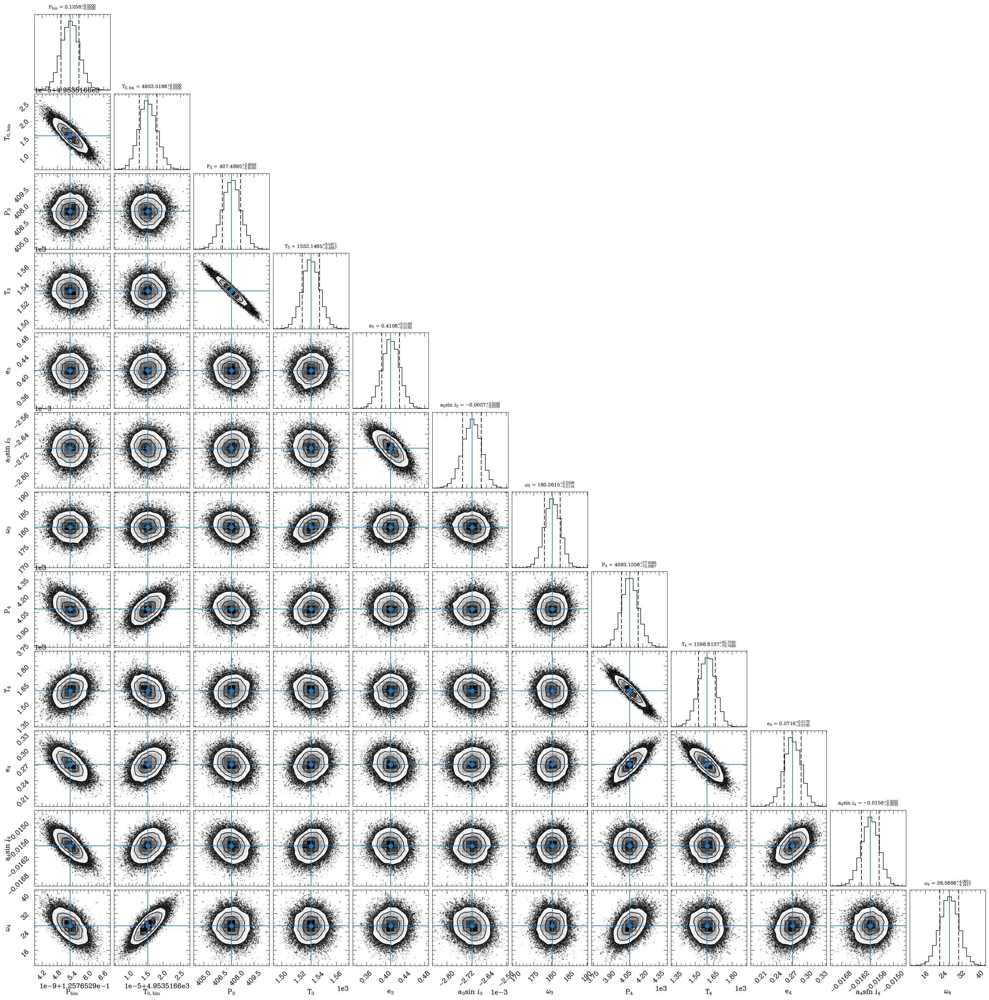

In [19]:
labels1 = [r'$\rm P_{bin}$', r'$\rm T_{0,bin}$', 
          r'$\rm P_{3}$', r'$\rm T_{3}$', r'$\mathrm{e}_{3}$', r'$\mathrm{a}_{3} \sin \, i_{3}$', r'$\omega_{3}$', 
          r'$\rm P_{4}$', r'$\rm T_{4}$', r'$\mathrm{e}_{4}$', r'$\mathrm{a}_{4} \sin \, i_{4}$', r'$\omega_{4}$']

value1 = results2
value2 = []
value3 = []


fig = corner.corner(flat_samples2, labels=labels1)


axes = np.array(fig.axes).reshape((ndim, ndim))
for i, label in enumerate(labels1):
    ax = axes[i,i]
    
    # Maximum Probability and interval
    ax.axvline(results2[i], color="tab:blue", linestyle="-")
    ax.axvline(results2[i] - erroinf2[i], color='k', ls='--')
    ax.axvline(results2[i] + errosup2[i], color='k', ls='--')
    ax.set_title(r'{0} = '.format(label)+ r'%.4f$^{+ %.4f}_{- %.4f}$'%(results2[i], errosup2[i], erroinf2[i]), fontsize=11)

    
    
for yi in range(ndim):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(value1[xi], color='tab:blue', ls='-')
        ax.axhline(value1[yi], color='tab:blue', ls='-')
        ax.plot(value1[xi], value1[yi], color="tab:blue", marker='o')


plt.savefig('model_2bodys_corner.png')

Salvando os ajustes em uma tabela:

In [20]:
tbl2 = table.Table()
tbl2['parametros'] = np.array(labels)
tbl2['valor']      = np.array(results2)
tbl2['erro_inf']   = erroinf2
tbl2['erro_sup']   = errosup2


ascii.write(tbl2, 'model_2bodys.dat', overwrite=True)
tbl2

parametros,valor,erro_inf,erro_sup
str6,float64,float64,float64
P,0.1257652953023964,3.57033957953945e-10,3.4603228615814885e-10
T0,4953.516615511288,2.5099634513026103e-06,2.681969817786012e-06
P3,407.4895421113513,0.8194972005624663,0.8086392776862681
T3,1532.1465142952584,9.465663532648932,9.567101057143873
e3,0.41060258512487086,0.018330018653473168,0.018160439217596303
asini3,-0.002698081188310667,3.870704323618267e-05,3.7092593788920665e-05
o3,180.2615028303486,2.211407365498843,2.230774147803345
P4,4083.1256126385824,75.08871778558205,77.90856173647171
T4,1598.6136552772302,70.74893921770649,65.72833602273181


Fazendo nosso plot para os resultados obtidos e o chi-quadrado reduzido, $\chi^2_{red}$, para medir a qualidade deste ajuste:

$$\chi^2_{red} = \frac{1}{N-M}\sum^{N}_{1}\left(\frac{O_j - C_j}{\sigma_j}\right)^2$$

In [21]:
x.shape

(9480,)

In [22]:
# Definindo função para calcular chi-quadrado reduzido:
def reduced_chi2_2bodys(x, y, yerr, params):
    N = len(x)
    M = len(params)
    model = model_2bodys(x, *params)
    chi2 = (1/(N-M)) * np.sum(((y - model)/yerr)**2)
    return chi2

# Calculando o chi-quadrado reduzido
params_2bodys = ascii.read('model_2bodys.dat')['valor']
print('Chi2 (2 planetas): ', reduced_chi2_2bodys(x, y, yerr, params_2bodys))

Chi2 (2 planetas):  11.901971806540141


Text(18500.0, 50, '$\\chi^{2}_{\\rm red} = $11.902')

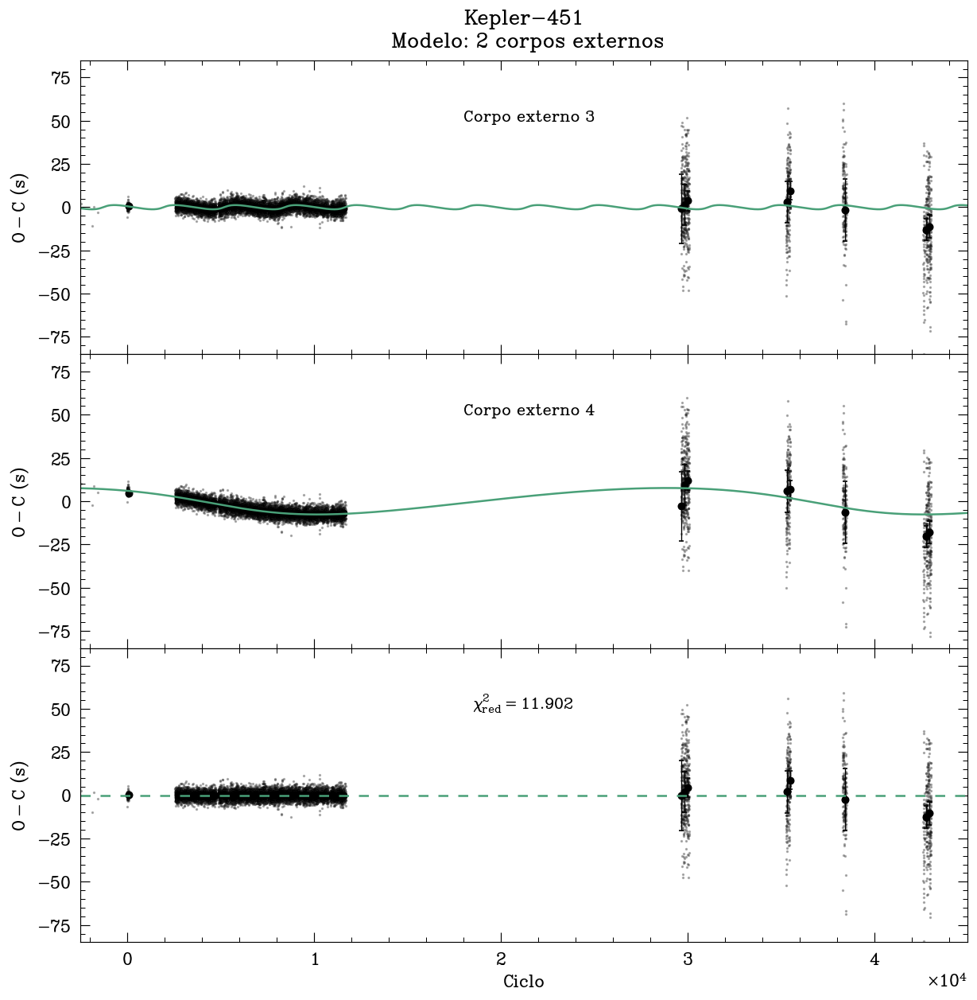

In [27]:
@jit(nopython=True)
def model_2bodys_mod (x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4):
    
    c   = 299792458          
    UA  = 149597870700
    
    n_points = len(x)

    efli = np.zeros(n_points)     
    tau3 = np.zeros(n_points)
    tau4 = np.zeros(n_points)

    r3   = 360./P3
    r4   = 360./P4

    for idx in range(n_points):
        n = x[idx]
        
        # Efeméride linear
        el = T0 + P*n
        efli[idx] = el
        
        # Primeiro corpo externo
        M  = ((T0 + P*n) - T3)*r3
        M1 = M -(360*int(M/360.))
        M2 = M1 * np.pi / 180.
        eps = M2 + e3*np.sin(M2)
        eps1 = eps + (M2 - (eps - e3*np.sin(eps)))/(1.0 - e3*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e3*np.sin(eps1)))/(1.0 - e3*np.cos(eps1))
        q  = np.sqrt((1.0 + e3) / (1.0 - e3)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)
        aux1  = asini3*UA / (c*24*3600)
        aux2  = ((1. - e3**2) / (1 + e3*np.cos(v))) * np.sin(v + ((o3%360)*np.pi/180.))
        aux3  = e3*np.sin((o3%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau3[idx] = mody
        
        # Segundo corpo externo
        M  = ((T0 + P*n) - T4)*r4
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e4*np.sin(M2)     
        eps1 = eps + (M2 - (eps - e4*np.sin(eps)))/(1.0 - e4*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e4*np.sin(eps1)))/(1.0 - e4*np.cos(eps1))
        q  = np.sqrt((1.0 + e4) / (1.0 - e4)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini4*UA / (c*24*3600)
        aux2  = ((1. - e4**2) / (1 + e4*np.cos(v))) * np.sin(v + ((o4%360)*np.pi/180.))
        aux3  = e4*np.sin((o4%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau4[idx] = mody
        
    return efli, tau3, tau4

results_2bodys = ascii.read('model_2bodys.dat')['valor']
P      = results_2bodys[0]
T0     = results_2bodys[1] 
P3     = results_2bodys[2] 
T3     = results_2bodys[3] 
e3     = results_2bodys[4] 
asini3 = results_2bodys[5]
o3     = results_2bodys[6] 
P4     = results_2bodys[7] 
T4     = results_2bodys[8]
e4     = results_2bodys[9] 
asini4 = results_2bodys[10]
o4     = results_2bodys[11]

efli, tau3, tau4 = model_2bodys_mod(x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4)

x0 = np.linspace(-2500, 4.5e4, 1000)
eflic, tau3c, tau4c = model_2bodys_mod(x0, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4)

nbin = 65
xbin1, _, yerrbin1, ybin_efli = adaptative_bin(x, y, yerr, y - tau3 - tau4, nbin)
xbin2, _, yerrbin2, ybin_tau3 = adaptative_bin(x, y, yerr, y - efli - tau4, nbin)
xbin3, _, yerrbin3, ybin_tau4 = adaptative_bin(x, y, yerr, y - efli - tau3, nbin)
xbin4, _, yerrbin4, ybin_all  = adaptative_bin(x, y, yerr, y - efli - tau3 - tau4, nbin)


fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace=0)

ax1 = plt.subplot(311)
ax1.scatter(x, (y - efli - tau4)*24*3600, s=1, alpha=.3, c='grey')
ax1.errorbar(xbin2, (ybin_tau3)*24*3600, yerr=yerrbin2*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax1.plot(x0, (tau3c)*24*3600, c='#49a078', lw=1.5)
ax1.set_ylabel(r'$\rm O-C$ (s)')
ax1.set_xticklabels([])
ax1.set_xlim(-2500, 4.5e4)
ax1.set_ylim(-85, 85)
ax1.set_title('Kepler-451\n Modelo: 2 corpos externos')
ax1.annotate(text='Corpo externo 3', xy=(1.8e4, 50), fontsize=14)


ax2 = plt.subplot(312)
ax2.scatter(x, (y - efli - tau3)*24*3600, s=1, alpha=.3, c='grey')
ax2.errorbar(xbin3, (ybin_tau4)*24*3600, yerr=yerrbin3*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax2.plot(x0, (tau4c)*24*3600, c='#49a078', lw=1.5)
ax2.set_ylabel(r'$\rm O-C$ (s)')
ax2.set_xticklabels([])
ax2.set_xlim(-2500, 4.5e4)
ax2.set_ylim(-85, 85)
ax2.annotate(text='Corpo externo 4', xy=(1.8e4, 50), fontsize=14)


ax3 = plt.subplot(313)
ax3.scatter(x, (y - efli - tau3 - tau4)*24*3600, s=1, alpha=.3, c='gray')
ax3.errorbar(xbin4, (ybin_all)*24*3600, yerr=yerrbin4*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax3.axhline(y=0.0, ls=(0,(5,5)),  c='#49a078', lw=1.5)
ax3.set_xlabel(r'Ciclo')
ax3.set_ylabel(r'$\rm O-C$ (s)')
ax3.set_xlim(-2500, 4.5e4)
ax3.set_ylim(-85, 85)
ax3.annotate(text=r'$\chi^{2}_{\rm red} = $%.3f'%(reduced_chi2_2bodys(x, y, yerr, results_2bodys)), xy=(1.85e4, 50), fontsize=14)

plt.savefig('O-C_2bodys.png')

# (ii) Modelo com três planetas

Refazendo toda a metologia do modelo para 2 planetas, mas dessa vez para 3, sendo eles:

- Um planeta com órbita de $\sim$404 dias;

- Um planeta com órbita de $\sim$1616 (4 $\times$ 404) dias;

- Um planeta com órbita de $\sim$6000 dias.

In [38]:
@jit(nopython=True)
def model_3bodys (x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5):
    
    c   = 299792458                         
    UA  = 149597870700            
    
    n_points = len(x)

    efli = np.zeros(n_points)     
    tau3 = np.zeros(n_points)
    tau4 = np.zeros(n_points)
    tau5 = np.zeros(n_points)

    r3   = 360./P3                
    r4   = 360./P4
    r5   = 360./P5

    for idx in range(n_points):
        n = x[idx]
        
        # Efeméride linear
        el = T0 + P*n
        efli[idx] = el
        
        # Primeiro corpo externo
        M  = ((T0 + P*n) - T3)*r3    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e3*np.sin(M2)
        eps1 = eps + (M2 - (eps - e3*np.sin(eps)))/(1.0 - e3*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e3*np.sin(eps1)))/(1.0 - e3*np.cos(eps1))
        q  = np.sqrt((1.0 + e3) / (1.0 - e3)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini3*UA / (c*24*3600)
        aux2  = ((1. - e3**2) / (1 + e3*np.cos(v))) * np.sin(v + ((o3%360)*np.pi/180.))
        aux3  = e3*np.sin((o3%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau3[idx] = mody
        
        # Segundo corpo externo
        M  = ((T0 + P*n) - T4)*r4    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e4*np.sin(M2) 
        eps1 = eps + (M2 - (eps - e4*np.sin(eps)))/(1.0 - e4*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e4*np.sin(eps1)))/(1.0 - e4*np.cos(eps1))
        q  = np.sqrt((1.0 + e4) / (1.0 - e4)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini4*UA / (c*24*3600)
        aux2  = ((1. - e4**2) / (1 + e4*np.cos(v))) * np.sin(v + ((o4%360)*np.pi/180.))
        aux3  = e4*np.sin((o4%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau4[idx] = mody

         # Terceiro corpo externo
        M  = ((T0 + P*n) - T5)*r5    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e5*np.sin(M2)  
        eps1 = eps + (M2 - (eps - e5*np.sin(eps)))/(1.0 - e5*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e5*np.sin(eps1)))/(1.0 - e5*np.cos(eps1))
        q  = np.sqrt((1.0 + e5) / (1.0 - e5)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini5*UA / (c*24*3600)
        aux2  = ((1. - e5**2) / (1 + e5*np.cos(v))) * np.sin(v + ((o5%360)*np.pi/180.))
        aux3  = e5*np.sin((o5%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau5[idx] = mody

        
    Tmin = efli + tau3 + tau4 + tau5
    return Tmin


p0 = [0.125765282, 4953.516,
      404, 1243, 0.16, 1.805*np.sin(179.92*np.pi/180), 140,
      4*404, 1243, 0.36, 1.40*np.sin(60*np.pi/180), 200,
      5000, 1243, 0.36, 5.8940*np.sin(180.400*np.pi/180), 140]

bounds = [(0.1250, 4900,
           300, 1000, 0.0, 0., 0, 0,
           1000, 1000, 0.0, 0. , 0., 0.,
           5000, 1000, 0.0, 0. , 0., 0.),
          (0.1260, 5000,
           np.inf, 2000, 0.99, 10., 360, 360,
           np.inf, 2000, 0.99, 10., 360, 360,
           np.inf, 2000, 0.99, 10., 360, 360)]

params3_, cov3_ = optimize.curve_fit(model_3bodys, x, y, sigma=yerr, p0 = p0, maxfev=5000)
params3_

array([ 1.25765288e-01,  4.95351676e+03,  4.22981006e+02,  1.12300287e+03,
        1.55765565e-01,  2.32347427e-03,  1.45695095e+02,  1.77030274e+03,
        1.04936824e+03,  3.44730173e-01,  1.32820767e-02,  2.31800466e+02,
        4.66234294e+03,  1.36226587e+03,  4.16106770e-01, -4.01451371e-02,
        1.17267273e+02])

In [39]:
@jit(nopython=True)
def lnlike_model3(theta, x, y, yerr):
    P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5 = theta
    model = model_3bodys(x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5)
    chi2 = np.sum(((y - model)/yerr)**2)
    if np.isnan(chi2) or np.isinf(chi2):
        return -np.inf
    return -0.5 * chi2    


@jit(nopython=True)
def lnprior_model3(theta):
    P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5 = theta
    if (0.1257 < P < 0.1258 and 4953.51 < T0 < 4953.52 and
        300 < P3 < 500 and 1000 < T3 < 2000 and 0.0 <= e3 < 0.5 and -10 < asini3 < 10 and 0 < o3 < 360 and
        1000 < P4 < 2000 and 1000 < T4 < 2000 and 0.0 <= e4 < 0.99 and -10 < asini4 < 10 and 0 < o4 < 360 and
        4000 < P5 < 7000 and 1000 < T5 < 2000 and 0.0 <= e5 < 0.99 and -10 < asini5 < 10 and 0 < o5 < 360):
        return 0.0
    return -np.inf


@jit(nopython=True)
def lnpos_model3(theta, x, y, yerr):
    lnprior = lnprior_model3(theta)
    if not np.isfinite(lnprior):
        return -np.inf
    return lnprior + lnlike_model3(theta, x, y, yerr)     

In [40]:
params3_

array([ 1.25765288e-01,  4.95351676e+03,  4.22981006e+02,  1.12300287e+03,
        1.55765565e-01,  2.32347427e-03,  1.45695095e+02,  1.77030274e+03,
        1.04936824e+03,  3.44730173e-01,  1.32820767e-02,  2.31800466e+02,
        4.66234294e+03,  1.36226587e+03,  4.16106770e-01, -4.01451371e-02,
        1.17267273e+02])

In [41]:
Pi      = 1.25765288e-01
T0i     = 4.95351676e+03
P3i     = 4.22981006e+02
T3i     = 1.12300287e+03
e3i     = 1.55765565e-01
asini3i = 2.32347427e-03
o3i     = 1.45695095e+02
P4i     = 1.77030274e+03
T4i     = 1.04936824e+03
e4i     = 3.44730173e-01
asini4i = 1.32820767e-02
o4i     = 2.31800466e+02
P5i     = 4.66234294e+03
T5i     = 1.36226587e+03
e5i     = 4.16106770e-01
asini5i = -4.01451371e-02
o5i     = 1.17267273e+02

initial = np.array([])
initial = Pi, T0i, P3i, T3i, e3i, asini3i, o3i, P4i, T4i, e4i, asini4i, o4i, P5i, T5i, e5i, asini5i, o5i

In [42]:
pos1 = np.array([])
pos2 = np.array([])
walk = [1e-5 for i in range(len(initial))]
for i in range(2*len(initial)):
    for j in range(len(walk)):
        pos = initial[j] + walk[j] * np.random.randn(1)
        pos1 = np.append(pos1, pos)

pos2 = np.concatenate((pos2, pos1))
pos3 = np.reshape(pos2, (-1, len(initial)))

labels = ['P', 'T0', 'P3', 'T3', 'e3', 'asini3', 'o3', 'P4', 'T4', 'e4', 'asini4', 'o4', 'P5', 'T5', 'e5', 'asini5', 'o5']
print('+--------------------------------------+')
print('                 Ranges')
print('+--------------------------------------+')
for i in range(len(labels)):
    print(labels[i]+' = (%.8f, %.8f)'%(min(pos3[:,i]), max(pos3[:,i])))

+--------------------------------------+
                 Ranges
+--------------------------------------+
P = (0.12575237, 0.12578613)
T0 = (4953.51674643, 4953.51677907)
P3 = (422.98098114, 422.98103178)
T3 = (1123.00284679, 1123.00289342)
e3 = (0.15575181, 0.15578220)
asini3 = (0.00229812, 0.00234038)
o3 = (145.69507857, 145.69511411)
P4 = (1770.30272189, 1770.30275855)
T4 = (1049.36822102, 1049.36826059)
e4 = (0.34471183, 0.34474962)
asini4 = (0.01325873, 0.01330293)
o4 = (231.80044032, 231.80048183)
P5 = (4662.34291430, 4662.34296744)
T5 = (1362.26584921, 1362.26589212)
e5 = (0.41608580, 0.41613621)
asini5 = (-0.04016089, -0.04012646)
o5 = (117.26725872, 117.26729285)


In [43]:
nwalkers, ndim = pos3.shape

sampler = emcee.EnsembleSampler(nwalkers, ndim, lnpos_model3, args=(x, y, yerr))
sampler.run_mcmc(pos3, 20000, progress=True);
samples = sampler.chain[:, :, :].reshape((-1, ndim))
ndim

100%|██████████| 20000/20000 [3:29:09<00:00,  1.59it/s]      


17

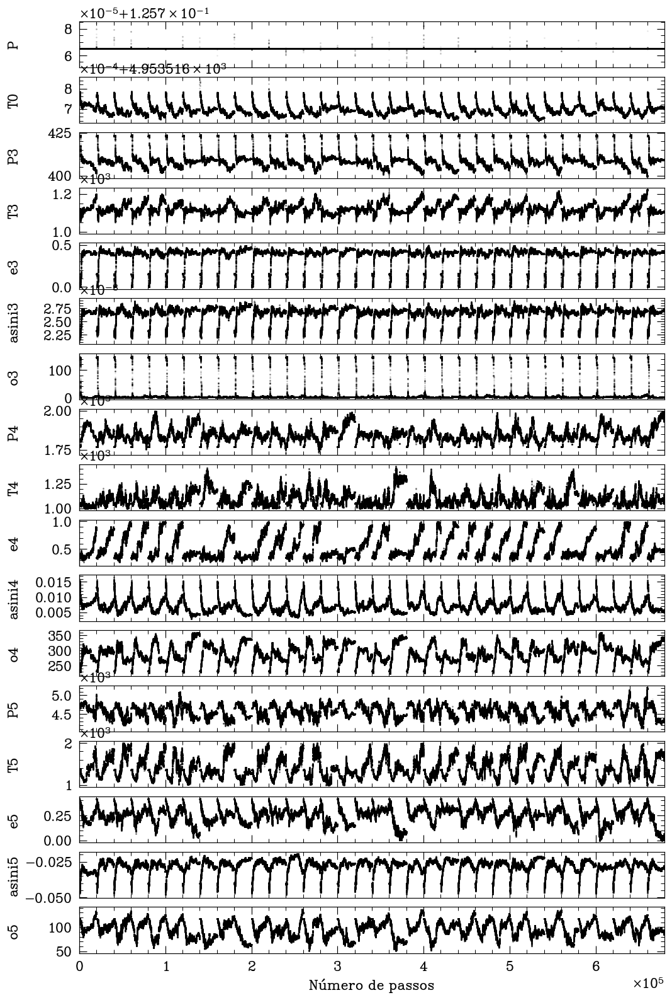

In [44]:
fig, axes = plt.subplots(ndim, figsize=(10, 16), sharex=True)
samples = sampler.chain[:, :, :].reshape((-1, ndim))
labels = ['P', 'T0', 'P3', 'T3', 'e3', 'asini3', 'o3', 'P4', 'T4', 'e4', 'asini4', 'o4', 'P5', 'T5', 'e5', 'asini5', 'o5']

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, i,], ".k", alpha=0.1, ms=1)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
axes[-1].set_xlabel("Número de passos");
fig.savefig("aposteriori_3bodys.png")

In [45]:
flat_samples3 = sampler.get_chain(discard=2000, flat=True)

In [46]:
results3 = np.array([])
erroinf3 = np.array([])
errosup3 = np.array([])
for i in range(ndim):
    mcmc = np.percentile(flat_samples3[:, i], [16, 50, 84])
    q    = np.diff(mcmc)
    results3 = np.append(results3, mcmc[1])
    erroinf3 = np.append(erroinf3, q[0])
    errosup3 = np.append(errosup3, q[1])
    txt = "\mathrm{{{3}}} = {0:.4f}_{{-{1:.4f}}}^{{{2:.4f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

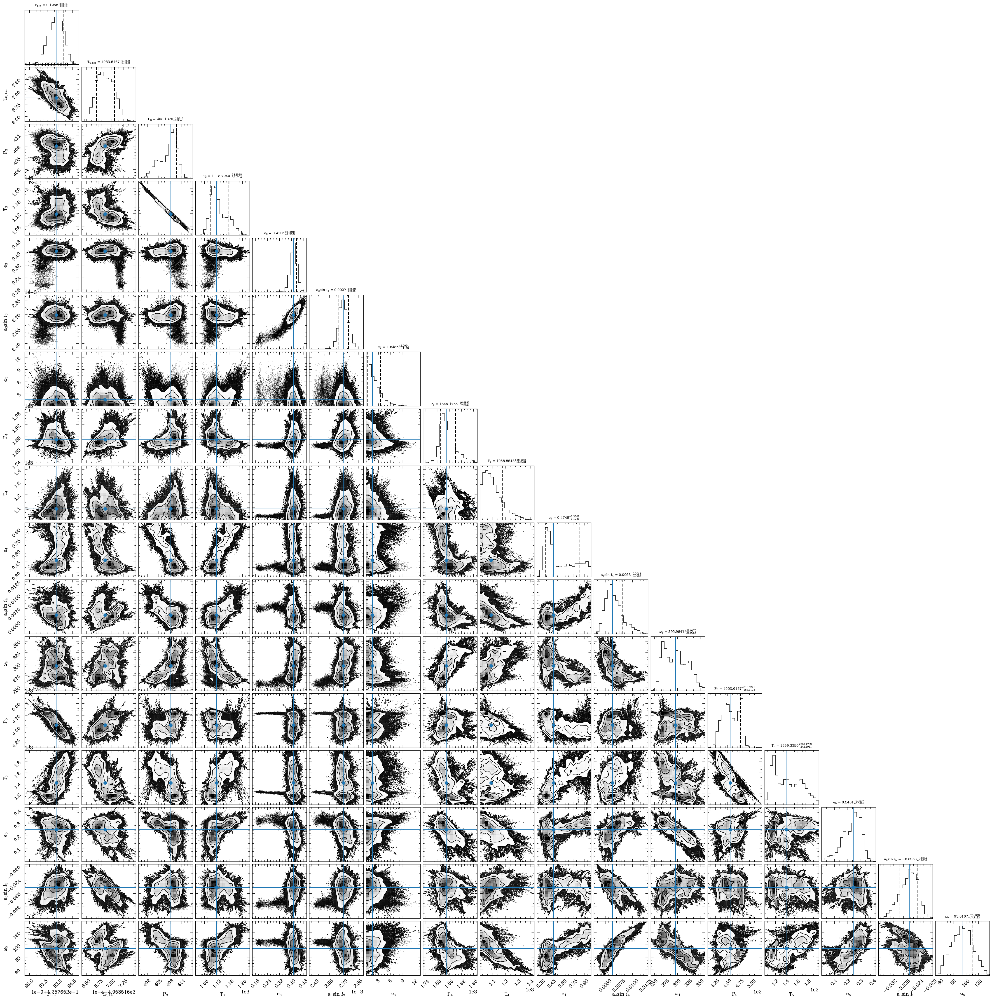

In [47]:
labels1 = [r'$\rm P_{bin}$', r'$\rm T_{0,bin}$', 
          r'$\rm P_{3}$', r'$\rm T_{3}$', r'$\mathrm{e}_{3}$', r'$\mathrm{a}_{3} \sin \, i_{3}$', r'$\omega_{3}$', 
          r'$\rm P_{4}$', r'$\rm T_{4}$', r'$\mathrm{e}_{4}$', r'$\mathrm{a}_{4} \sin \, i_{4}$', r'$\omega_{4}$',
          r'$\rm P_{5}$', r'$\rm T_{5}$', r'$\mathrm{e}_{5}$', r'$\mathrm{a}_{5} \sin \, i_{5}$', r'$\omega_{5}$']

value1 = results3
value2 = []
value3 = []


fig = corner.corner(flat_samples3, labels=labels1)


axes = np.array(fig.axes).reshape((ndim, ndim))
for i, label in enumerate(labels1):
    ax = axes[i,i]
    
    # Maximum Probability and interval
    ax.axvline(results3[i], color="tab:blue", linestyle="-")
    ax.axvline(results3[i] - erroinf3[i], color='k', ls='--')
    ax.axvline(results3[i] + errosup3[i], color='k', ls='--')
    ax.set_title(r'{0} = '.format(label)+ r'%.4f$^{+ %.4f}_{- %.4f}$'%(results3[i], errosup3[i], erroinf3[i]), fontsize=11)

    
    
for yi in range(ndim):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(value1[xi], color='tab:blue', ls='-')
        ax.axhline(value1[yi], color='tab:blue', ls='-')
        ax.plot(value1[xi], value1[yi], color="tab:blue", marker='o')


plt.savefig('model_3bodys_corner.png')

In [48]:
tbl3 = table.Table()
tbl3['parametros'] = np.array(labels)
tbl3['valor']      = np.array(results3)
tbl3['erro_inf']   = erroinf3
tbl3['erro_sup']   = errosup3


ascii.write(tbl3, 'model_3bodys.dat', overwrite=True)
tbl3

parametros,valor,erro_inf,erro_sup
str6,float64,float64,float64
P,0.1257652928209027,8.573895760033423e-10,7.293177728406874e-10
T0,4953.516687396901,1.6960221728368197e-05,1.9191137653251644e-05
P3,408.13762377953014,3.3647800249333955,1.5145684708637646
T3,1118.7949031262735,18.273445383780427,38.85249904819102
e3,0.4136371703519723,0.022894735399288324,0.021011724316323255
asini3,0.0026949260731389656,4.5845977604255014e-05,5.2884141819146274e-05
o3,1.5436120142023106,1.11181224192262,2.003394800883795
P4,1845.176604130162,27.33467816021016,46.58920115190472
T4,1088.8545457412085,55.2781176904582,88.4455529002596


In [49]:
# Definindo função para calcular chi-quadrado reduzido:
def reduced_chi2_3bodys(x, y, yerr, params):
    N = len(x)
    M = len(params)
    model = model_3bodys(x, *params)
    chi2 = (1/(N-M)) * np.sum(((y - model)/yerr)**2)
    return chi2

# Calculando o chi-quadrado reduzido
params_3bodys = ascii.read('model_3bodys.dat')['valor']
print('Chi2 (3 planetas): ', reduced_chi2_3bodys(x, y, yerr, params_3bodys))

Chi2 (3 planetas):  12.221595297427776


Text(18500.0, 50, '$\\chi^{2}_{\\rm red} = $12.222')

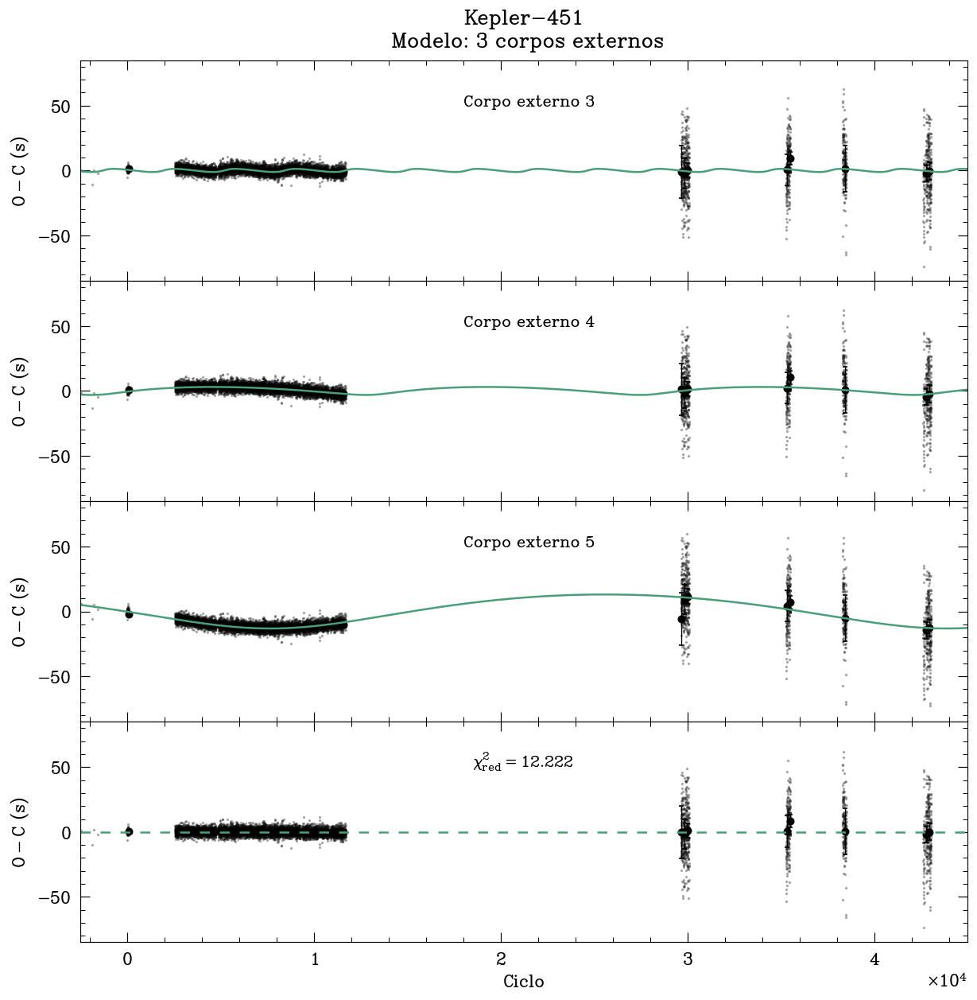

In [62]:
@jit(nopython=True)
def model_3bodys_mod (x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5):
    
    c   = 299792458                         
    UA  = 149597870700            
    
    n_points = len(x)

    efli = np.zeros(n_points)     
    tau3 = np.zeros(n_points)
    tau4 = np.zeros(n_points)
    tau5 = np.zeros(n_points)

    r3   = 360./P3                
    r4   = 360./P4
    r5   = 360./P5

    for idx in range(n_points):
        n = x[idx]
        
        # Efeméride linear
        el = T0 + P*n
        efli[idx] = el
        
        # Primeiro corpo externo
        M  = ((T0 + P*n) - T3)*r3    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e3*np.sin(M2)
        eps1 = eps + (M2 - (eps - e3*np.sin(eps)))/(1.0 - e3*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e3*np.sin(eps1)))/(1.0 - e3*np.cos(eps1))
        q  = np.sqrt((1.0 + e3) / (1.0 - e3)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini3*UA / (c*24*3600)
        aux2  = ((1. - e3**2) / (1 + e3*np.cos(v))) * np.sin(v + ((o3%360)*np.pi/180.))
        aux3  = e3*np.sin((o3%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau3[idx] = mody
        
        # Segundo corpo externo
        M  = ((T0 + P*n) - T4)*r4    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e4*np.sin(M2)   
        eps1 = eps + (M2 - (eps - e4*np.sin(eps)))/(1.0 - e4*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e4*np.sin(eps1)))/(1.0 - e4*np.cos(eps1))
        q  = np.sqrt((1.0 + e4) / (1.0 - e4)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini4*UA / (c*24*3600)
        aux2  = ((1. - e4**2) / (1 + e4*np.cos(v))) * np.sin(v + ((o4%360)*np.pi/180.))
        aux3  = e4*np.sin((o4%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau4[idx] = mody

         # Terceiro corpo externo
        M  = ((T0 + P*n) - T5)*r5    
        M1 = M -(360*int(M/360.))    
        M2 = M1 * np.pi / 180.
        eps = M2 + e5*np.sin(M2) 
        eps1 = eps + (M2 - (eps - e5*np.sin(eps)))/(1.0 - e5*np.cos(eps))
        for i in range(10):
            eps1 = eps1 + (M2 - (eps1 - e5*np.sin(eps1)))/(1.0 - e5*np.cos(eps1))
        q  = np.sqrt((1.0 + e5) / (1.0 - e5)) * np.tan(eps1 / 2.0)
        v  = 2. * np.arctan(q)       
        aux1  = asini5*UA / (c*24*3600)
        aux2  = ((1. - e5**2) / (1 + e5*np.cos(v))) * np.sin(v + ((o5%360)*np.pi/180.))
        aux3  = e5*np.sin((o5%360)*np.pi/180.)
        mody  = aux1 * (aux2 + aux3)
        tau5[idx] = mody

    return efli, tau3, tau4, tau5


results_3bodys = ascii.read('model_3bodys.dat')['valor']
P      = results_3bodys[0]
T0     = results_3bodys[1] 
P3     = results_3bodys[2] 
T3     = results_3bodys[3] 
e3     = results_3bodys[4] 
asini3 = results_3bodys[5]
o3     = results_3bodys[6] 
P4     = results_3bodys[7] 
T4     = results_3bodys[8]
e4     = results_3bodys[9] 
asini4 = results_3bodys[10]
o4     = results_3bodys[11]
P5     = results_3bodys[12] 
T5     = results_3bodys[13]
e5     = results_3bodys[14] 
asini5 = results_3bodys[15]
o5     = results_3bodys[16]

efli, tau3, tau4, tau5 = model_3bodys_mod(x, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5)

x0 = np.linspace(-2500, 4.5e4, 1000)
eflic, tau3c, tau4c, tau5c = model_3bodys_mod(x0, P, T0, P3, T3, e3, asini3, o3, P4, T4, e4, asini4, o4, P5, T5, e5, asini5, o5)

nbin = 65
xbin1, _, yerrbin1, ybin_efli = adaptative_bin(x, y, yerr, y - tau3 - tau4 - tau5, nbin)
xbin2, _, yerrbin2, ybin_tau3 = adaptative_bin(x, y, yerr, y - efli - tau4 - tau5, nbin)
xbin3, _, yerrbin3, ybin_tau4 = adaptative_bin(x, y, yerr, y - efli - tau3 - tau5, nbin)
xbin4, _, yerrbin4, ybin_tau5 = adaptative_bin(x, y, yerr, y - efli - tau3 - tau4, nbin)
xbin5, _, yerrbin5, ybin_all  = adaptative_bin(x, y, yerr, y - efli - tau3 - tau4 - tau5, nbin)


fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace=0)

ax1 = plt.subplot(411)
ax1.scatter(x, (y - efli - tau4 - tau5)*24*3600, s=1, alpha=.3, c='grey')
ax1.errorbar(xbin2, (ybin_tau3)*24*3600, yerr=yerrbin2*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax1.plot(x0, (tau3c)*24*3600, c='#49a078', lw=1.5)
ax1.set_ylabel(r'$\rm O-C$ (s)')
ax1.set_xticklabels([])
ax1.set_xlim(-2500, 4.5e4)
ax1.set_ylim(-85, 85)
ax1.set_title('Kepler-451\n Modelo: 3 corpos externos')
ax1.annotate(text='Corpo externo 3', xy=(1.8e4, 50), fontsize=14)


ax2 = plt.subplot(412)
ax2.scatter(x, (y - efli - tau3 - tau5)*24*3600, s=1, alpha=.3, c='grey')
ax2.errorbar(xbin3, (ybin_tau4)*24*3600, yerr=yerrbin3*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax2.plot(x0, (tau4c)*24*3600, c='#49a078', lw=1.5)
ax2.set_ylabel(r'$\rm O-C$ (s)')
ax2.set_xticklabels([])
ax2.set_xlim(-2500, 4.5e4)
ax2.set_ylim(-85, 85)
ax2.annotate(text='Corpo externo 4', xy=(1.8e4, 50), fontsize=14)


ax3 = plt.subplot(413)
ax3.scatter(x, (y - efli - tau3 - tau4)*24*3600, s=1, alpha=.3, c='grey')
ax3.errorbar(xbin4, (ybin_tau5)*24*3600, yerr=yerrbin4*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax3.plot(x0, (tau5c)*24*3600, c='#49a078', lw=1.5)
ax3.set_ylabel(r'$\rm O-C$ (s)')
ax3.set_xticklabels([])
ax3.set_xlim(-2500, 4.5e4)
ax3.set_ylim(-85, 85)
ax3.annotate(text='Corpo externo 5', xy=(1.8e4, 50), fontsize=14)


ax4 = plt.subplot(414)
ax4.scatter(x, (y - efli - tau3 - tau4 - tau5)*24*3600, s=1, alpha=.3, c='gray')
ax4.errorbar(xbin5, (ybin_all)*24*3600, yerr=yerrbin5*24*3600, marker='o', ls='', capsize=2, c='k', lw=.8, ms=5, zorder=1)
ax4.axhline(y=0.0, ls=(0,(5,5)),  c='#49a078', lw=1.5)
ax4.set_xlabel(r'Ciclo')
ax4.set_ylabel(r'$\rm O-C$ (s)')
ax4.set_xlim(-2500, 4.5e4)
ax4.set_ylim(-85, 85)
ax4.annotate(text=r'$\chi^{2}_{\rm red} = $%.3f'%(reduced_chi2_3bodys(x, y, yerr, results_3bodys)), xy=(1.85e4, 50), fontsize=14)

plt.savefig('O-C_3bodys.png')